# Traitement d'images : filtrage, seuillage, et comptage d'objets avec opencv

Une initiation à la biblithèque opencv 

# Veille technologique: Opencv python

-  Suivre les instructions et faire une recherche selon ce qui est demandé.

## Operations Simples

In [74]:
# pip install scikit-image

C:\Users\julyc\AppData\Local\Temp\ipykernel_13796\3356497847.py:12: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow(image)


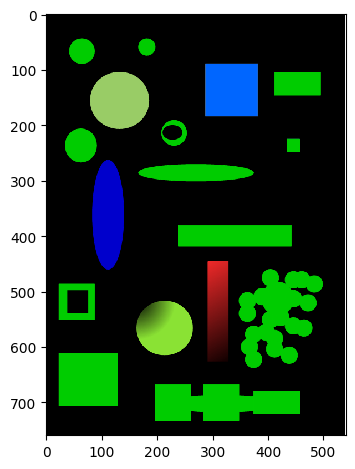

In [75]:
# utiliser OpenCV pour importer et afficher l'image
import cv2
import matplotlib.pyplot as plt
import numpy as np
import skimage as sk
from skimage import io
from skimage.io import imread, imshow, imsave

# lire l'image (avec imread)
image = imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_01.png')
# afficher image
imshow(image)
plt.show()

In [76]:
# afficher la taille de l'image
image.shape

(760, 541, 4)

In [77]:
# l'image a trois couleur R,G,B. afficher les valeurs des trois couleurs pour le pixel x = 150, et y = 100
image[100, 150]

array([  0,   0,   0, 255], dtype=uint8)

(760, 541, 4) (610, 441, 4)


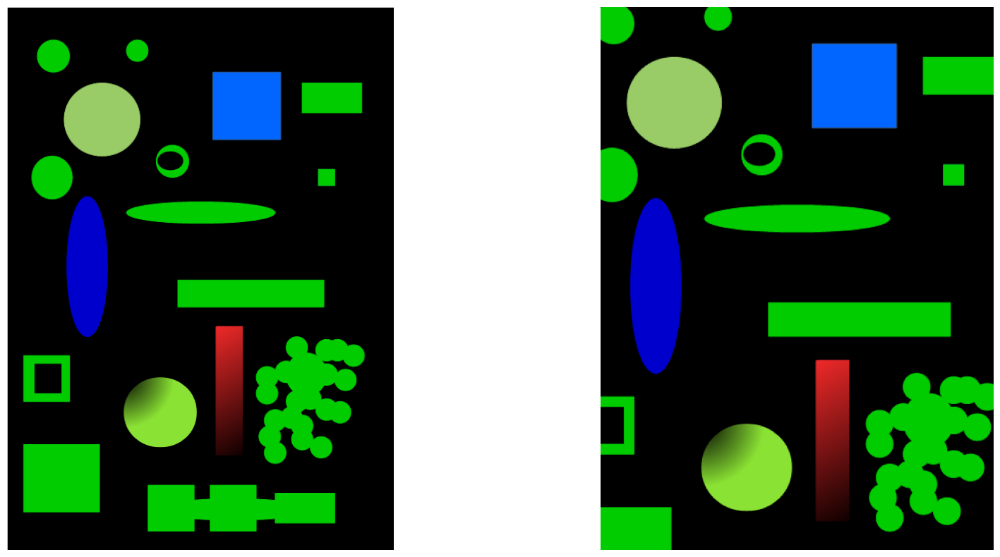

In [78]:
# Crop une partie de l'image (sélectionner une petite partie à partir des coordonnées)
from skimage.util import crop

image_base = imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_01.png')

image_cropped = crop(image_base, ((50, 100), (50, 50), (0, 0)), copy=False)

print(image_base.shape, image_cropped.shape)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_base), plt.axis('off')
plt.subplot(122), plt.imshow(image_cropped), plt.axis('off')
plt.show()

# Méthode avec numpy, moins prise de tête :

[[[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 ...

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]]


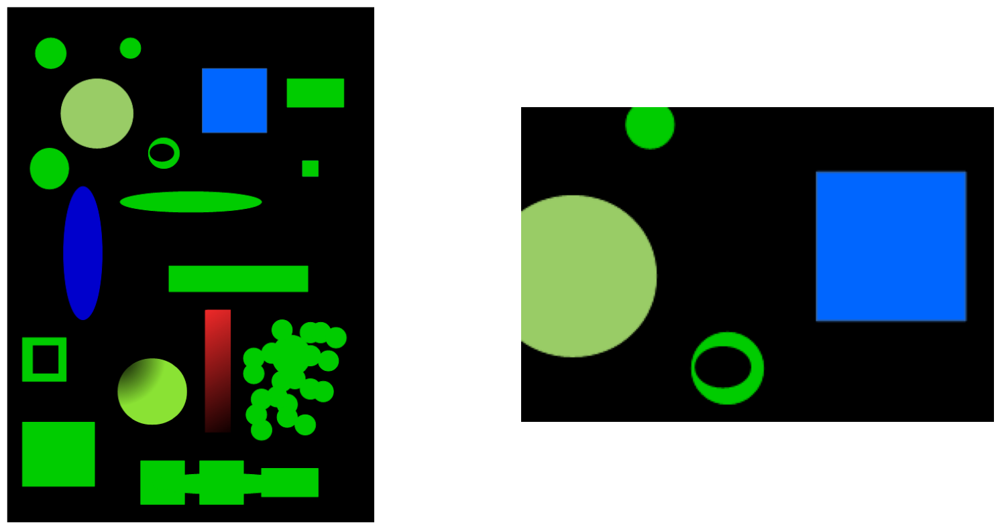

In [79]:
image_base = imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_01.png')

image_cropped = image_base[50:250, 100:400]

print(image_cropped)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_base), plt.axis('off')
plt.subplot(122), plt.imshow(image_cropped), plt.axis('off')
plt.show()

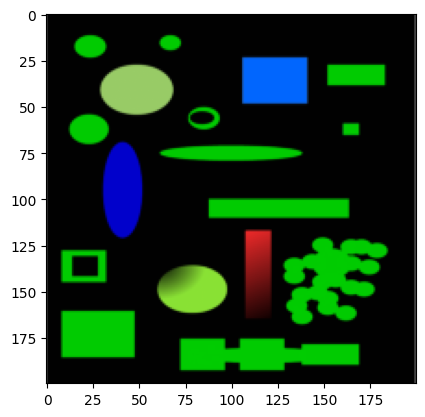

(200, 200, 4)


In [80]:
# redimensioner l'image à 200x200 pixels
from skimage.transform import resize
resized = resize(image_base, (200, 200))
# afficher resized
plt.imshow(resized)
plt.show()
print(resized.shape)
# qu'est ce que vous remarquez !!
# tout est applatit ? et flou ? 

Nouvelle forme : (200, 200, 4)


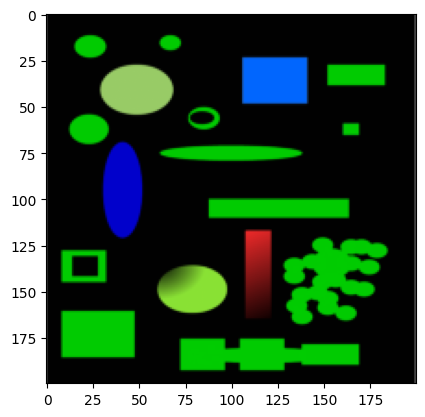

In [81]:
# On redimensionne à 200x200
# skimage est intelligent : il va garder les 4 canaux (RGBA) si on ne lui dit rien
image_resized = resize(image_base, (200, 200))

# Si on veut se débarrasser du 4ème canal (la transparence) pour n'avoir que le RGB :
image_rgb = image_base[:, :, :3] 

print(f"Nouvelle forme : {image_resized.shape}")

plt.imshow(image_resized)
plt.show()

(760, 541, 4)
(200, 200, 4)


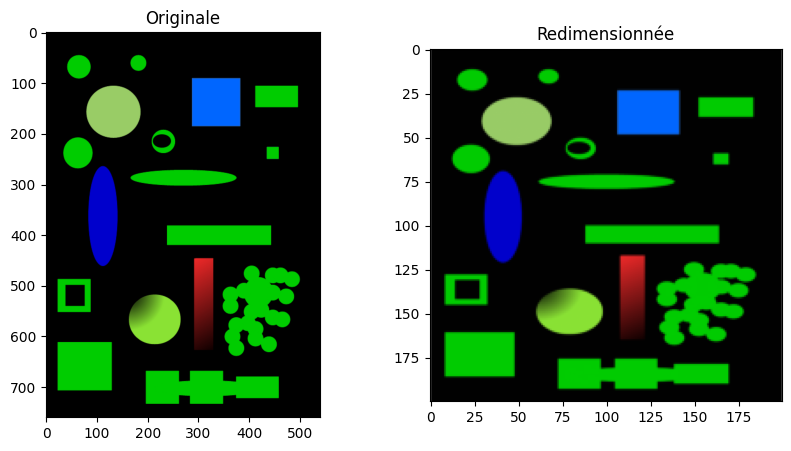

In [82]:
# redimensinner sans affecter l'image
image_travail = np.copy(image_base)
image_resized = resize(image_travail, (200, 200), anti_aliasing=True)
print(image_base.shape)
print(image_resized.shape)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_base), plt.title("Originale")
plt.subplot(122), plt.imshow(image_resized), plt.title("Redimensionnée")
plt.show()

Faire tourner une image -45°

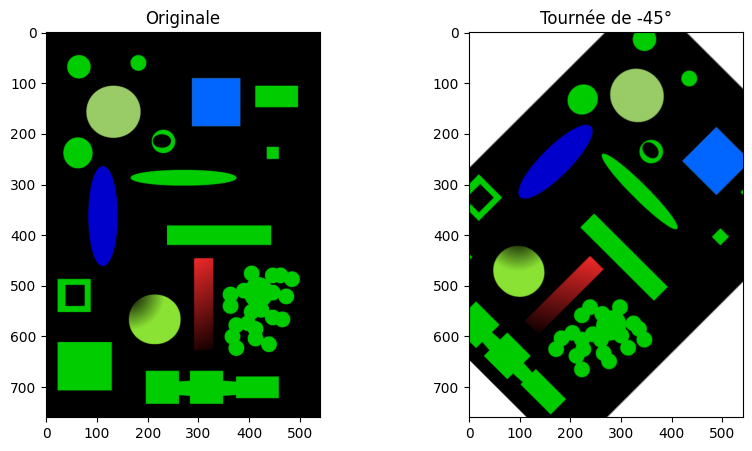

In [83]:
from skimage.transform import rotate

rotated = rotate(image_base, -45)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_base), plt.title("Originale")
plt.subplot(122), plt.imshow(rotated), plt.title("Tournée de -45°")
plt.show()

On peut faire une améliroation avec resize = True pour éviter d'avoir une image coupé et agrandir le cadre

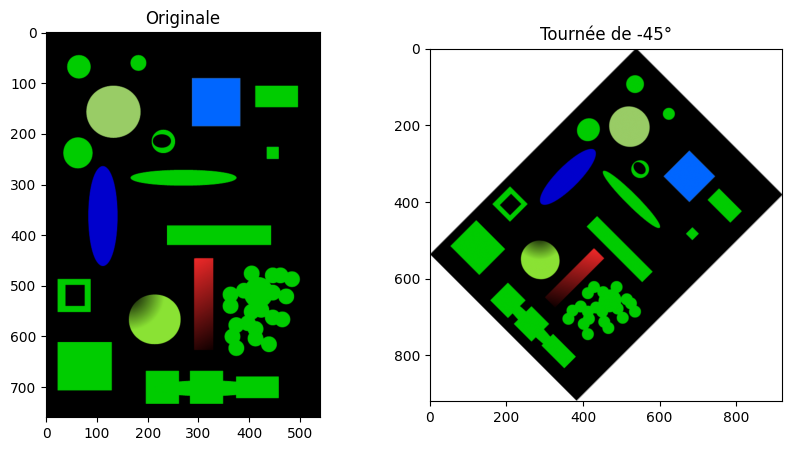

In [84]:
rotated_fix = rotate(image_base, -45, resize=True)
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_base), plt.title("Originale")
plt.subplot(122), plt.imshow(rotated_fix), plt.title("Tournée de -45°")
plt.show()

Vous pouvez utiliser la bibliothèque imutils pour faire les rotations et d'autres fonctions facilement. Pour l'instaler: pip install imutils

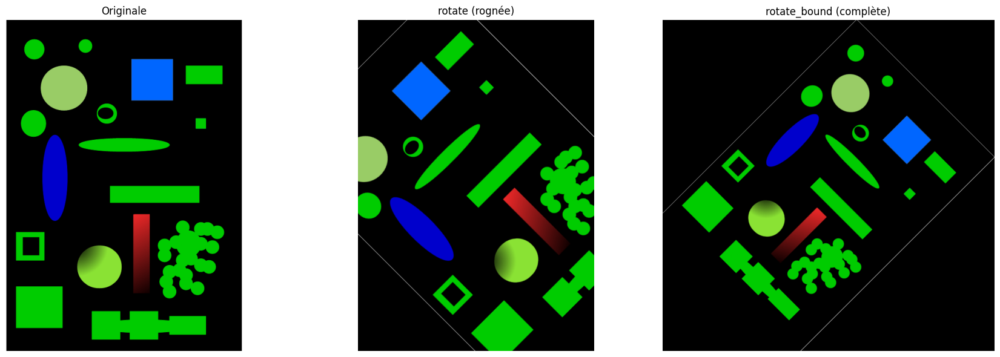

In [85]:
import imutils
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_01.png")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

rotated = imutils.rotate(img, angle=45)
rotated_rgb = cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)

rotated_bound = imutils.rotate_bound(img, angle=45)
rotated_bound_rgb = cv2.cvtColor(rotated_bound, cv2.COLOR_BGR2RGB)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

ax1.imshow(img_rgb)
ax1.set_title("Originale")
ax1.axis("off")

ax2.imshow(rotated_rgb)
ax2.set_title("rotate (rognée)")
ax2.axis("off")

ax3.imshow(rotated_bound_rgb)
ax3.set_title("rotate_bound (complète)")
ax3.axis("off")

plt.tight_layout()
plt.show()

# Dessiner sur l'image

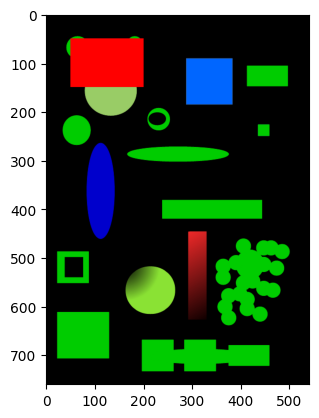

In [ ]:
from skimage.draw import rectangle

# 1. On définit le rectangle : (point_en_haut_à_gauche, étendue)
# start = (y_début, x_début)
# extent = (hauteur, largeur)
start = (50, 50)
extent = (100, 150)

# 2. La fonction nous donne les listes des lignes (rr) et des colonnes (cc)
rr, cc = rectangle(start, extent=extent, shape=image_base.shape)

# 3. On applique la couleur sur ces coordonnées
# On choisit du Rouge pur par exemple : [255, 0, 0, 255]
image_avec_rectangle = np.copy(image_base)
image_avec_rectangle[rr, cc] = [255, 0, 0, 255] 

plt.imshow(image_avec_rectangle)
plt.show()

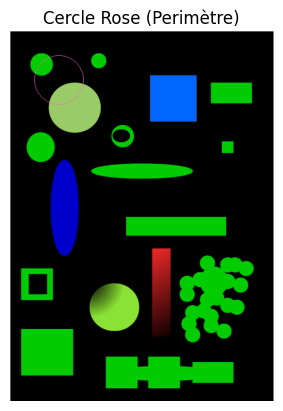

In [ ]:
# dessiner un circle
from skimage.draw import circle_perimeter

image_cercle = np.copy(image_base)

# 2. On définit le centre (r, c) et le rayon
# r = ligne (y), c = colonne (x)
centre_y, centre_x = 100, 100
rayon = 50

rr, cc = circle_perimeter(centre_y, centre_x, rayon, shape=image_cercle.shape)

image_cercle[rr, cc] = [255, 100, 200, 255]

plt.imshow(image_cercle)
plt.title("Cercle Rose (Périmètre)")
plt.axis('off')
plt.show()

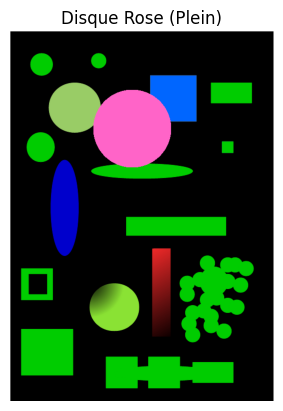

In [88]:
from skimage.draw import disk

image_disque = np.copy(image_base)
centre_y, centre_x = 200, 250
rayon = 80
rr, cc = disk((centre_y, centre_x), rayon, shape=image_disque.shape)

image_disque[rr, cc] = [255, 100, 200, 255]

plt.imshow(image_disque)
plt.title("Disque Rose (Plein)")
plt.axis('off')
plt.show()

# Filtrage d'image

* Blur
* Gaussian blur
* Median blur
* Sharpening
* Bilateral blur
* Bilateral filtering

In [89]:
import cv2 as cv 
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

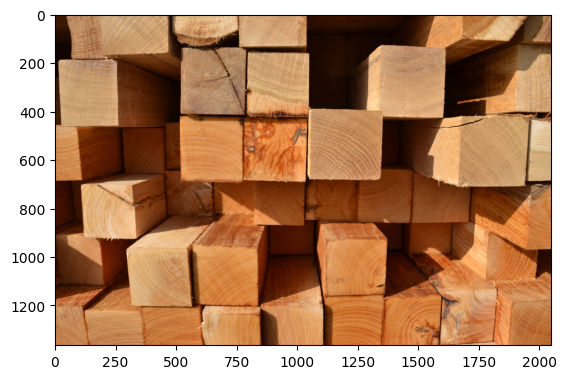

In [90]:
# charger et afficher l'image "bois"
image = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\bois.png")
image_cv = np.array(image)
plt.imshow(image_cv)

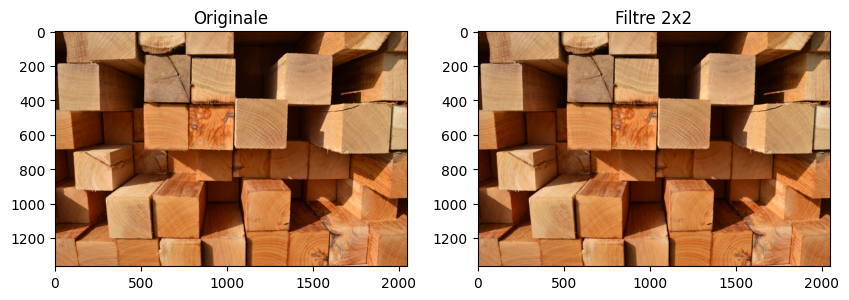

In [91]:
# Utiliser la méthode "cv2.filter2D" avec un kernel de taille 2
kernel = np.ones((2, 2), np.float32) / 4

bois_filtre = cv.filter2D(image_cv, -1, kernel)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(bois_filtre), plt.title("Filtre 2x2")
plt.show()

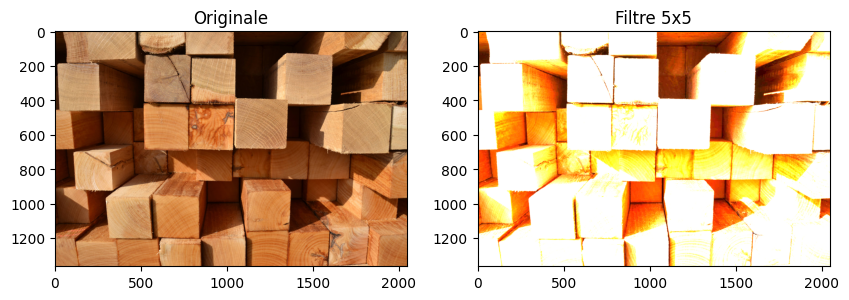

In [92]:
# Appliquer blur avec un kernel de taille 5x5
bois_filtre = cv.filter2D(image_cv, -1, kernel=5)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(bois_filtre), plt.title("Filtre 5x5")
plt.show()

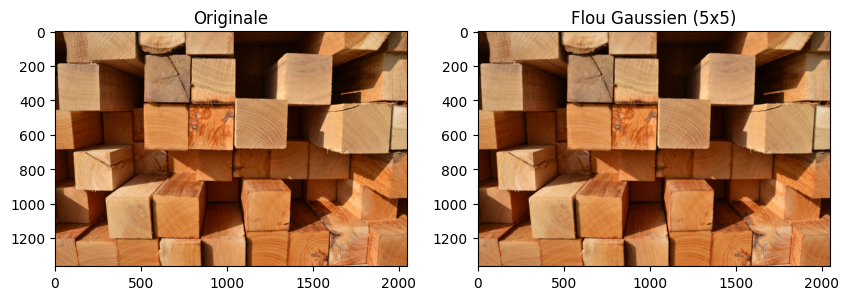

In [93]:
# gaussian blur
bois_blur = cv.GaussianBlur(image_cv, (5, 5), 0)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(bois_blur), plt.title("Flou Gaussien (5x5)")
plt.show()

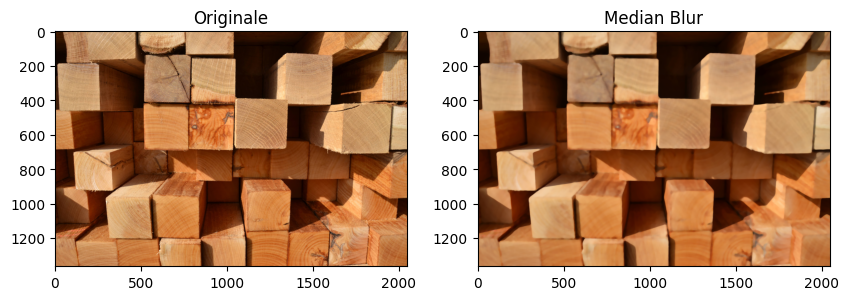

In [94]:
# median blur
image_medianblur = cv.medianBlur (image_cv,15)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(image_medianblur), plt.title("Median Blur")
plt.show()

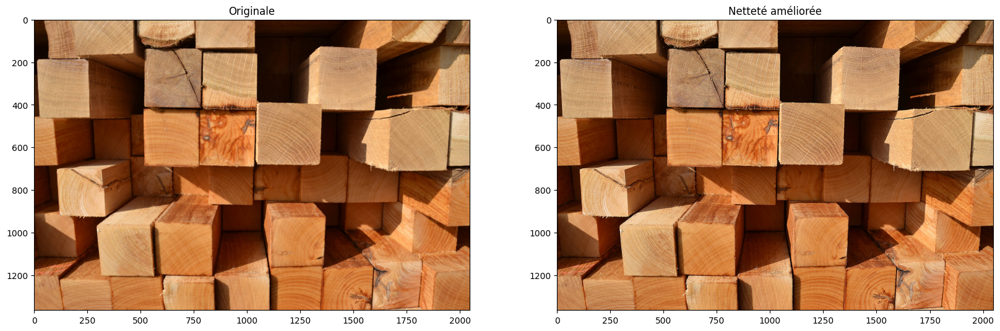

In [95]:
# netteté

kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened_image = cv2.filter2D(image_cv, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(sharpened_image), plt.title("Netteté améliorée")
plt.show()

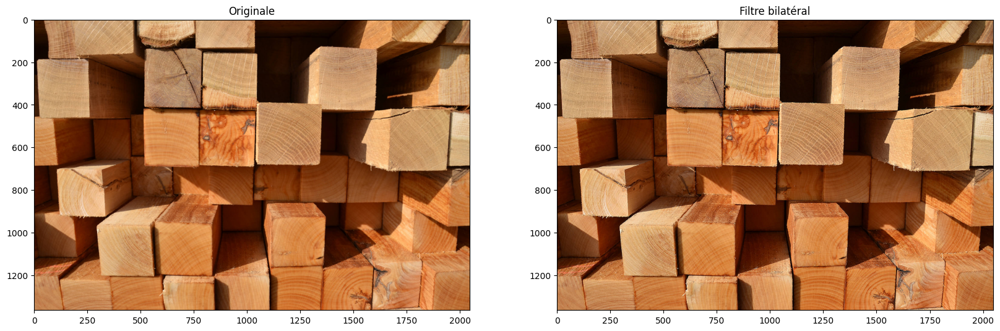

In [96]:
# bilateral filtering
image_flou = cv.bilateralFilter (image_cv,9,75,75)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(sharpened_image), plt.title("Filtre bilatéral")
plt.show()

# Seuillage d'image

En utilisant l'image "sudoku" appliquer:
* Binary Thresholding
* Otsu thresholding
* Adaptive thresholding

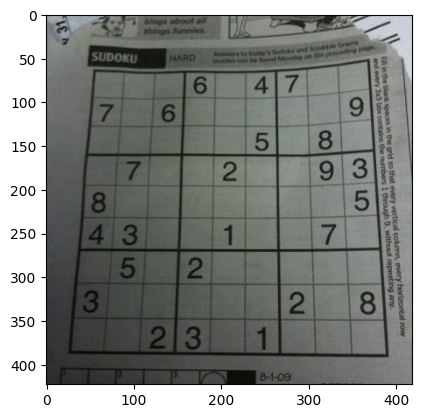

In [97]:
image = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\sudoku.jpg")
image_cv = np.array(image)
plt.imshow(image_cv)

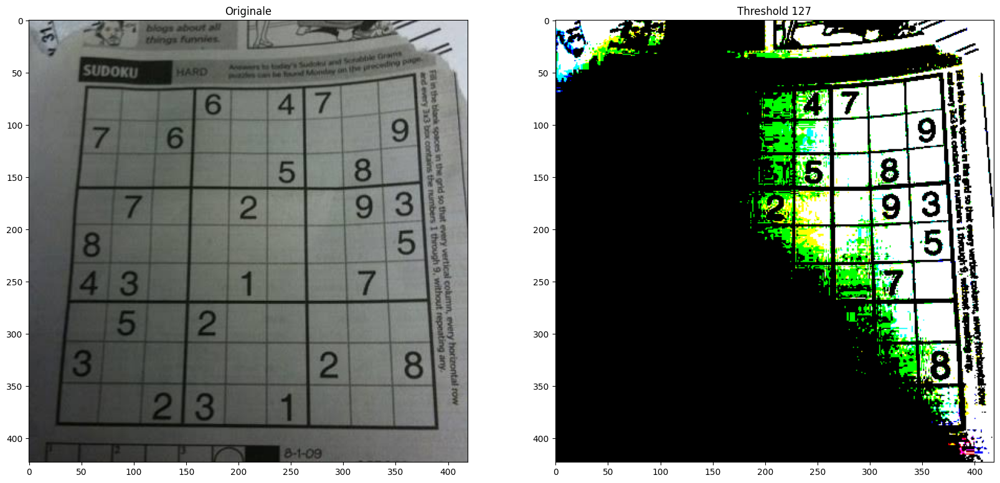

In [ ]:
# appliquer un seuillage binaire d'un seuil de 127
_, thres127 = cv.threshold(image_cv, 127, 255, cv.THRESH_BINARY)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
# Ici, on affiche seulement le deuxième morceau, l'image 
plt.subplot(122), plt.imshow(thres127, cmap='gray'), plt.title("Threshold 127")
plt.show()

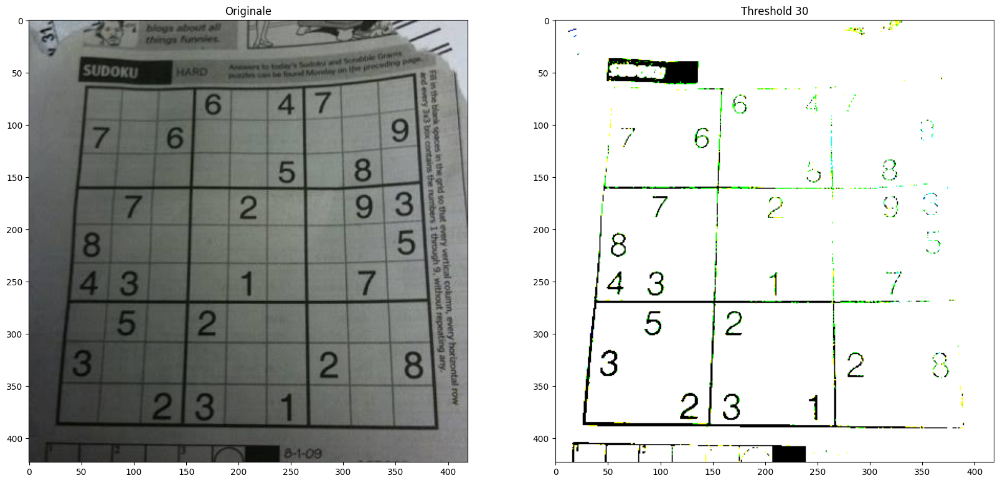

In [ ]:
# appliquer un seuillage binaire d'un seuil de 30
_, thres30 = cv.threshold(image_cv, 30, 255, cv.THRESH_BINARY)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
# Ici, on affiche seulement le deuxième morceau, l'image 
plt.subplot(122), plt.imshow(thres30, cmap='gray'), plt.title("Threshold 30")
plt.show()

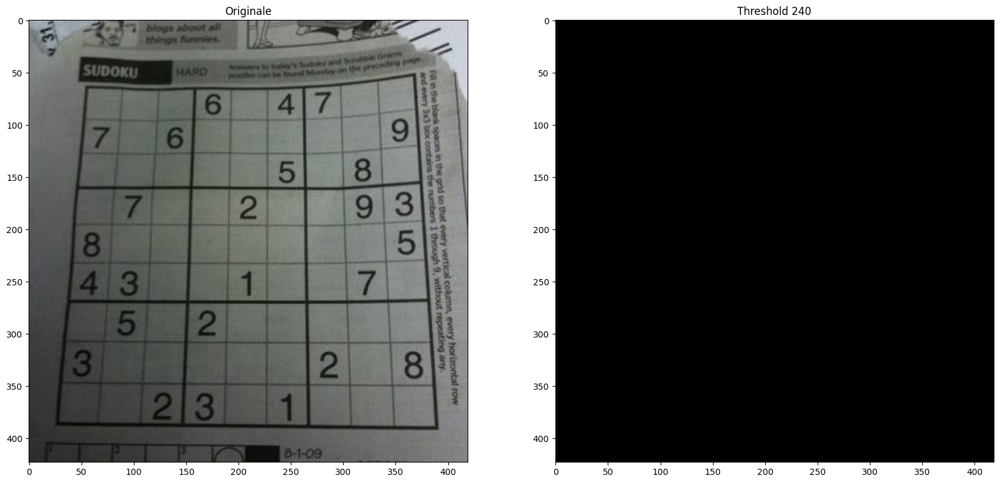

In [ ]:
# appliquer un seuillage binaire d'un seuil de 240
_, thres240 = cv.threshold(image_cv, 240, 255, cv.THRESH_BINARY)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
# Ici, on affiche seulement le deuxième morceau, l'image 
plt.subplot(122), plt.imshow(thres240, cmap='gray'), plt.title("Threshold 240")
plt.show()

Qu'est ce que vous remarquez ?!

Le threshold permet de mettre "une limite", si le pixel a une valeur au delà de cette limite -> il prend la couleur la plus clair (blanc) (si on est en binary), si la valeur du pixel est inférieur à la la limite -> couleur la plus foncé (noir) 

Le seuil optimal trouvé par Otsu est : 96.0


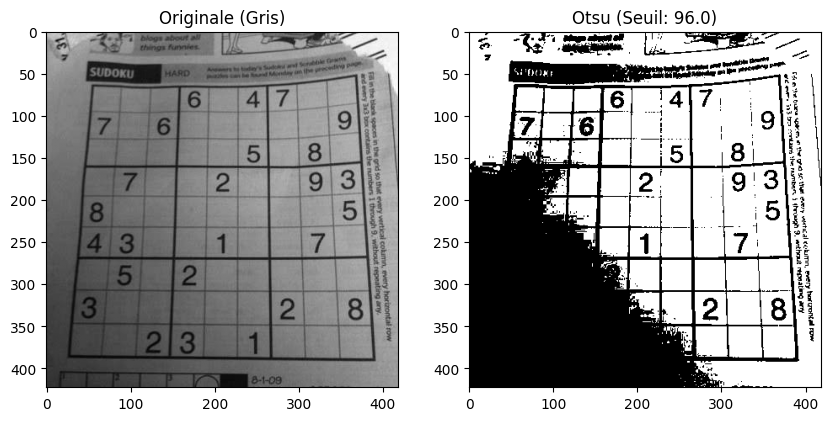

In [101]:
# appliquer "Otsu" seuillage
from PIL import Image

# 1. Charger avec PIL et convertir pour OpenCV
image_pil = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\sudoku.jpg")
img = np.array(image_pil)

# 2. Passage obligatoire en gris
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

# 3. Appliquer Otsu
# On met le seuil à 0 car OpenCV va le calculer tout seul grâce à cv.THRESH_OTSU
ret, thresh_otsu = cv.threshold(gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# 4. Affichage
print(f"Le seuil optimal trouvé par Otsu est : {ret}")

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(gray, cmap='gray'), plt.title("Originale (Gris)")
plt.subplot(122), plt.imshow(thresh_otsu, cmap='gray'), plt.title(f"Otsu (Seuil: {ret})")
plt.show()

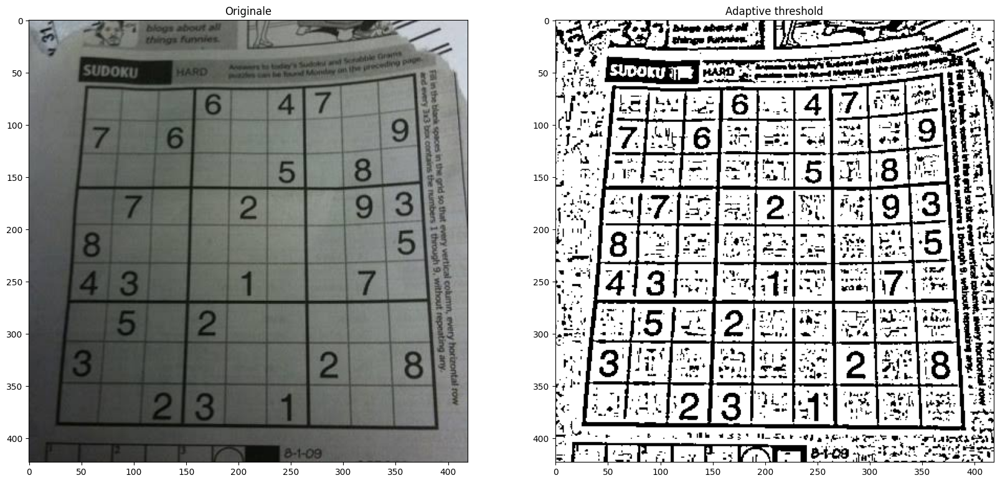

In [102]:
# appliquer "Adaptive threshold" -> permet d'adapter le threshold en fonction du pixel voisin afin de ne pas avoir un résultat dégueu

# Dabord faut mettre toute l'image en niveau de gris
image_gray = cv.cvtColor(image_cv, cv.COLOR_RGB2GRAY) 

thresat = cv.adaptiveThreshold(image_gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 2)

plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(image_cv), plt.title("Originale")
plt.subplot(122), plt.imshow(thresat, cmap='gray'), plt.title("Adaptive threshold")
plt.show()

# Détection des bords

* Sobel
* Canny

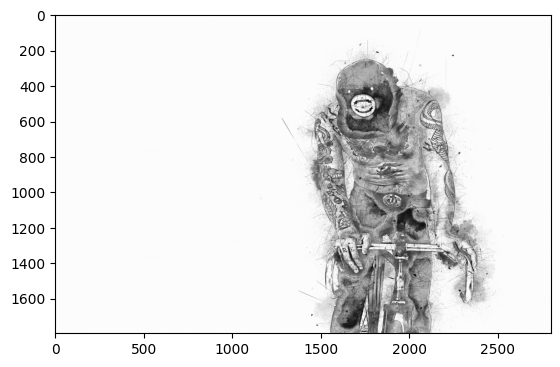

In [103]:
image_perso = cv.imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\banner-image-1.jpg')
plt.imshow(image_perso)

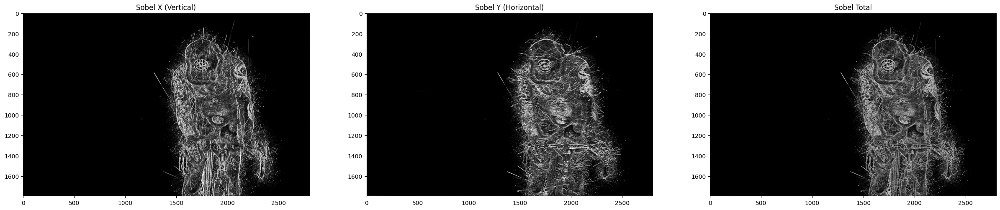

In [104]:
# utiliser la methode sobel pour détecter les bords
# Vous pouvez utiliser d'autres images de votre choix
image_perso = cv.imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\banner-image-1.jpg')

src_gray = cv.cvtColor(image_perso, cv.COLOR_BGR2GRAY)
grad_x = cv.Sobel(src_gray, cv.CV_16S, 1, 0, ksize=3)
grad_y = cv.Sobel(src_gray, cv.CV_16S, 0, 1, ksize=3)

abs_grad_x = cv.convertScaleAbs(grad_x)
abs_grad_y = cv.convertScaleAbs(grad_y)

grad_total = cv.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

plt.figure(figsize=(30, 20))
plt.subplot(131), plt.imshow(abs_grad_x, cmap='gray'), plt.title("Sobel X (Vertical)")
plt.subplot(132), plt.imshow(abs_grad_y, cmap='gray'), plt.title("Sobel Y (Horizontal)")
plt.subplot(133), plt.imshow(grad_total, cmap='gray'), plt.title("Sobel Total")
plt.show()

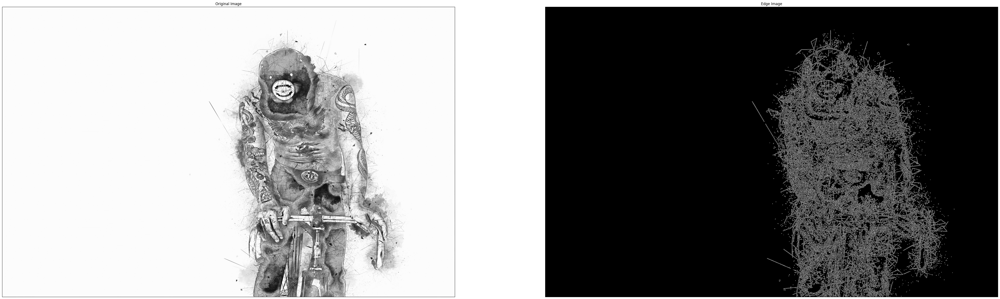

In [105]:
# Canny

img = cv.imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\banner-image-1.jpg', cv.IMREAD_GRAYSCALE)
edges = cv.Canny(img,100,200)
 
plt.figure(figsize=(60, 40))
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
 
plt.show()

# Détection des contours

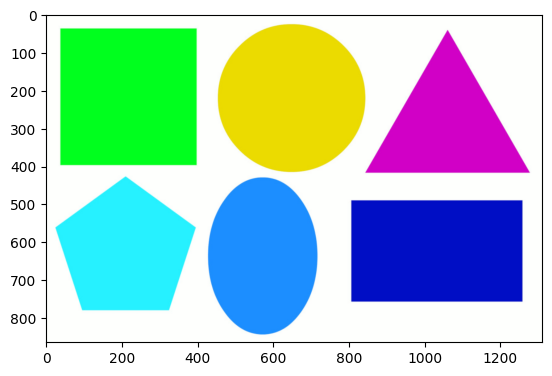

In [106]:
# charger l'image 02
# faites une recherche sur internet pour détecter les contours des objets dans image_02

image_02 = cv.imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_02.png')
plt.imshow(image_02)

In [ ]:
# 1. On définit le chemin au lieu de charger l'image tout de suite
path_image = 'C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_02.png'

def contourDetection(img):
    # --- 1. DETECTION CLASSIQUE (Bords) ---
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edged = cv2.Canny(blur, 30, 200)

    # --- 2. DETECTION SPECIALE JAUNE ---
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_yellow = np.array([15, 80, 80]) # On élargit un poil pour être sûr
    upper_yellow = np.array([35, 255, 255])
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # --- 3. LA FUSION ---
    # On combine les bords de Canny ET le masque jaune avec un "OU" logique (bit-wise OR)
    # Si c'est un bord OU si c'est du jaune, on le garde !
    combined_mask = cv2.bitwise_or(edged, mask_yellow)

    # Petit nettoyage pour boucher les trous
    kernel = np.ones((3,3), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)

    # --- 4. TROUVER LES CONTOURS SUR LE SUPER-MASQUE ---
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    print(f"Nombre total de formes trouvées = {len(contours)}")

    # Dessiner sur l'image d'origine
    res = img.copy()
    cv2.drawContours(res, contours, -1, (0, 255, 0), 3)
    
    cv2.imshow('Le Super Masque (Fusion)', combined_mask)
    cv2.imshow('Resultat final', res)


def main():
    # Charger l'image depuis le CHEMIN
    base_img = cv2.imread(path_image, cv2.IMREAD_UNCHANGED)
    
    if base_img is None:
        print("Erreur : Image introuvable !")
        return
    
    # Redimensionnement propre
    h, w = base_img.shape[:2] # On prend les 2 premiers (H et W)
    width = 512
    scale_f = width / w
    height = int(h * scale_f)
    img_resized = cv2.resize(base_img, (width, height))

    cv2.imshow('Originale Redimensionnee', img_resized)
    
    # On passe l'image à la fonction
    contourDetection(img_resized)
    
    # Attente touche ESC ou q
    print("Appuie sur 'q' ou 'ESC' pour fermer les fenêtres.")
    while True:
        key = cv2.waitKey(1) & 0xFF
        if key == 27 or key == ord('q'):
            break
    
    cv2.destroyAllWindows()

if __name__ == '__main__':
    main()

Nombre total de formes trouvées = 6
Appuie sur 'q' ou 'ESC' pour fermer les fenêtres.


#  Compter des objets

🚀 Nombre de formes détectées : 6


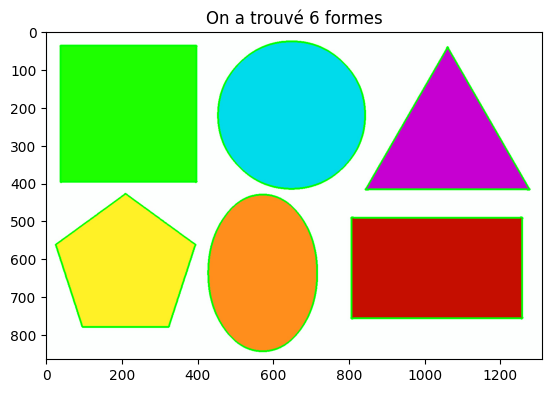

In [ ]:
# Compter les objets
# 1. Charger l'image
img = cv2.imread("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_02.png")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 2. Flou pour ne pas compter le "grain" de l'image
blur = cv2.GaussianBlur(gray, (7, 7), 0)

# 3. Seuil adaptatif
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# 4. Nettoyage 
kernel = np.ones((3,3), np.uint8)
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# 5. Trouver les contours
contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 6. Filtrer : On ne compte que les formes assez grosses
vraies_formes = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 100:  
        vraies_formes.append(cnt)

# 7. Affichage et résultat
print(f"🚀 Nombre de formes détectées : {len(vraies_formes)}")

# Dessiner pour vérifier
resultat = img.copy()
cv2.drawContours(resultat, vraies_formes, -1, (0, 255, 0), 3)

plt.imshow(cv2.cvtColor(resultat, cv2.COLOR_BGR2RGB))
plt.title(f"Il y a {len(vraies_formes)} formes")
plt.show()

# Challenge
Compter le nombre d'objets dans l'image 03 avec le code précédent.
- Qu'est ce que vous remarquez?
- Utiliser l'algorithme Watershed pour detecter et séparer les objets connectés.

🚀 Nombre de formes détectées : 1


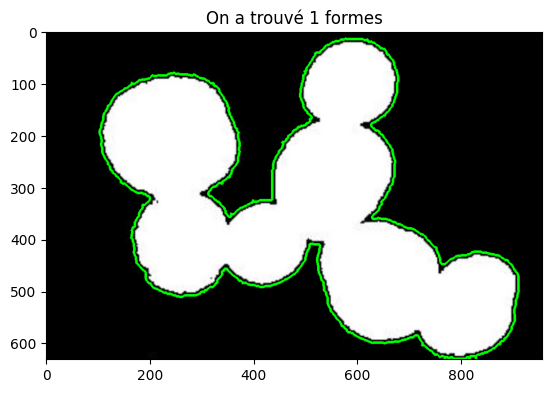

In [ ]:
# Compter les objets présents dans l'image 3

# 1. Charger l'image
img = cv2.imread("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_03.jpg")
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 2. Flou pour ne pas compter le "grain" de l'image
blur = cv2.GaussianBlur(gray, (7, 7), 0)

# 3. Seuil adaptatif 
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# 4. Nettoyage 
kernel = np.ones((3,3), np.uint8)
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# 5. Trouver les contours
contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 6. Filtrer : On ne compte que les formes assez grosses
vraies_formes = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 100: 
        vraies_formes.append(cnt)

# 7. Affichage et résultat
print(f"🚀 Nombre de formes détectées : {len(vraies_formes)}")

# Dessiner pour vérifier
resultat = img.copy()
cv2.drawContours(resultat, vraies_formes, -1, (0, 255, 0), 3)

plt.imshow(cv2.cvtColor(resultat, cv2.COLOR_BGR2RGB))
plt.title(f"Il y a {len(vraies_formes)} formes")
plt.show()



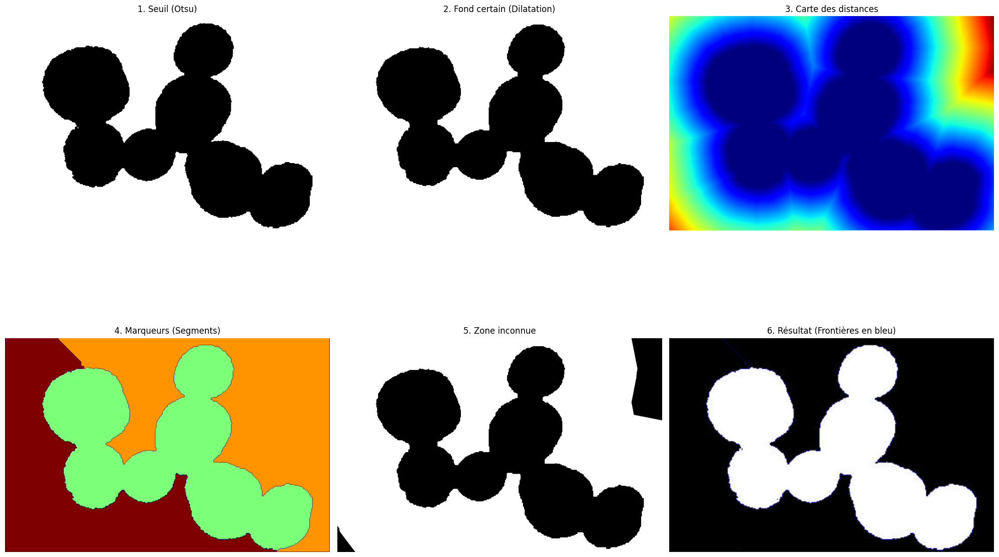

In [ ]:
img = cv.imread ( 'C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_03.jpg' )
assert img is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)


# Suppression du bruit
kernel = np.ones((3,3),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 2)
 
# Arrière plan
sure_bg = cv.dilate(opening,kernel,iterations=3)
 
# Trouver le premier plan certain 
dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0)
 
# Trouver la zone inconnue
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)


# Marker labelling
ret, markers = cv.connectedComponents(sure_fg)
 

markers = markers+1
 

markers[unknown==255] = 0


markers = cv.watershed(img,markers)
img[markers == -1] = [255,0,0]


import matplotlib.pyplot as plt

# 1. Préparer une grande figure pour tout voir
plt.figure(figsize=(20, 15))

# --- Affichage du seuillage (Otsu) ---
plt.subplot(231)
plt.imshow(thresh, cmap='gray')
plt.title("1. Seuil (Otsu)")
plt.axis('off')

# --- Affichage du "Sure Background" (L'arrière-plan certain) ---
plt.subplot(232)
plt.imshow(sure_bg, cmap='gray')
plt.title("2. Fond certain (Dilatation)")
plt.axis('off')

# --- Affichage de la Transformation de Distance ---
# C'est ce qui permet de trouver le centre de chaque forme
plt.subplot(233)
plt.imshow(dist_transform, cmap='jet')
plt.title("3. Carte des distances")
plt.axis('off')

# --- Affichage des Marqueurs (Markers) ---
# Chaque forme reçoit un numéro (une couleur différente ici)
plt.subplot(234)
plt.imshow(markers, cmap='jet')
plt.title("4. Marqueurs (Segments)")
plt.axis('off')

# --- L'inconnu (La zone où Watershed doit trancher) ---
plt.subplot(235)
plt.imshow(unknown, cmap='gray')
plt.title("5. Zone inconnue")
plt.axis('off')

# --- RÉSULTAT FINAL ---
plt.subplot(236)
# On convertit en RGB pour que le bleu reste bleu et pas orange
img_final_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img_final_rgb)
plt.title("6. Résultat (Frontières en bleu)")
plt.axis('off')

plt.tight_layout()
plt.show()

✅ Nombre d'objets séparés détectés : 2


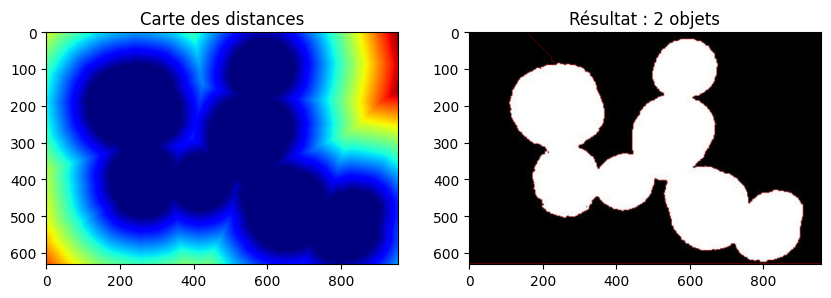

In [ ]:
# 1. Chargement et Gris
img = cv.imread('C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_03.jpg')
gris = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 2. Seuil d'Otsu pour isoler les formes
ret, seuil = cv.threshold(gris, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)

# 3. Nettoyage (Opening) pour enlever les petits points blancs parasites
kernel = np.ones((3,3), np.uint8)
opening = cv.morphologyEx(seuil, cv.MORPH_OPEN, kernel, iterations=2)

# 4. Trouver le fond certain (Dilatation)
sure_bg = cv.dilate(opening, kernel, iterations=3)

# 5. Trouver le cœur des formes (Distance Transform)
# C'est ici que la séparation se joue !
dist_transform = cv.distanceTransform(opening, cv.DIST_L2, 5)

# On ne garde que les centres des formes
ret, sure_fg = cv.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# 6. Zone inconnue (les frontières)
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)

# 7. Création des marqueurs
ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# 8. WATERSHED
markers = cv.watershed(img, markers)

# On dessine les frontières en ROUGE sur l'image d'origine
img[markers == -1] = [0, 0, 255]

# 9. COMPTER LE NOMBRE D'OBJETS
# Le nombre de formes = nombre de marqueurs moins le fond
nb_objets = ret - 1
print(f"✅ Nombre d'objets séparés détectés : {nb_objets}")

# Affichage
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(dist_transform, cmap='jet'), plt.title("Carte des distances")
plt.subplot(122), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), plt.title(f"Résultat : {nb_objets} objets")
plt.show()

Avant d'utiliser Watershed, si on fait juste un findContours, le nombre d'objets est faux. Si 2 formes se touchent, l'ordi ne voit 
qu'une seule grosse forme et il compte 1 objet au lieu de 2

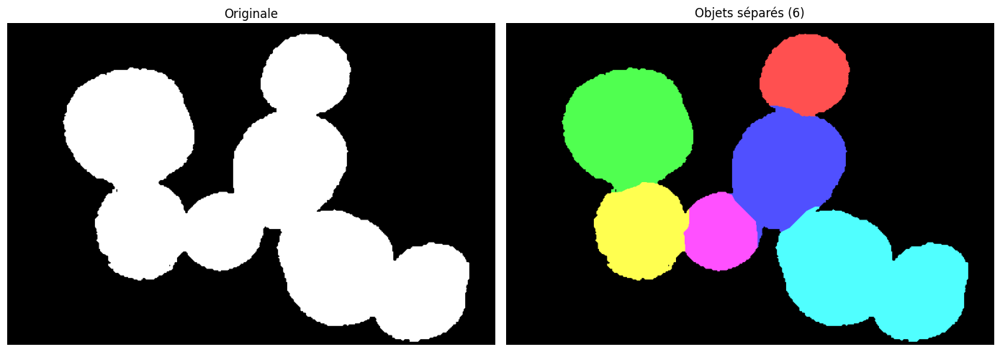

In [ ]:
from PIL import Image, ImageFilter
from collections import deque, Counter
import matplotlib.pyplot as plt

img = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_03.jpg").convert("L")
img = img.point(lambda p: 255 if p > 128 else 0)
w, h = img.size
img_pixels = img.load()

# 1. Érosion : réduit les objets jusqu'à casser les connexions
eroded = img.copy()
for _ in range(25):
    eroded = eroded.filter(ImageFilter.MinFilter(5))
eroded = eroded.point(lambda p: 255 if p > 128 else 0)
eroded_pixels = eroded.load()

# 2. Labellisation : flood fill pour identifier chaque composante
labels = [[0] * w for _ in range(h)]
label_id = 0

for y in range(h):
    for x in range(w):
        if eroded_pixels[x, y] == 255 and labels[y][x] == 0:
            label_id += 1
            queue = deque([(x, y)])
            while queue:
                cx, cy = queue.popleft()
                if 0 <= cx < w and 0 <= cy < h and eroded_pixels[cx, cy] == 255 and labels[cy][cx] == 0:
                    labels[cy][cx] = label_id
                    queue.extend([(cx+1,cy),(cx-1,cy),(cx,cy+1),(cx,cy-1)])

# Filtrer les fragments trop petits
counts = Counter()
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            counts[labels[y][x]] += 1

for y in range(h):
    for x in range(w):
        if labels[y][x] > 0 and counts[labels[y][x]] < 200:
            labels[y][x] = 0

# 3. Watershed maison : propager les labels sur l'image originale
queue = deque()
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            queue.append((x, y))

while queue:
    cx, cy = queue.popleft()
    for dx, dy in [(1,0),(-1,0),(0,1),(0,-1)]:
        nx, ny = cx + dx, cy + dy
        if 0 <= nx < w and 0 <= ny < h and labels[ny][nx] == 0 and img_pixels[nx, ny] == 255:
            labels[ny][nx] = labels[cy][cx]
            queue.append((nx, ny))

# 4. Coloriser chaque objet
colors = [(255,80,80),(80,255,80),(80,80,255),(255,255,80),(255,80,255),(80,255,255)]
result = Image.new("RGB", (w, h), (0, 0, 0))
rp = result.load()

for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            rp[x, y] = colors[(labels[y][x] - 1) % len(colors)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

ax1.imshow(img, cmap='gray')
ax1.set_title("Originale")
ax1.axis("off")

ax2.imshow(result)
ax2.set_title(f"Objets séparés ({len([c for c in counts.values() if c >= 200])})")
ax2.axis("off")

plt.tight_layout()
plt.show()

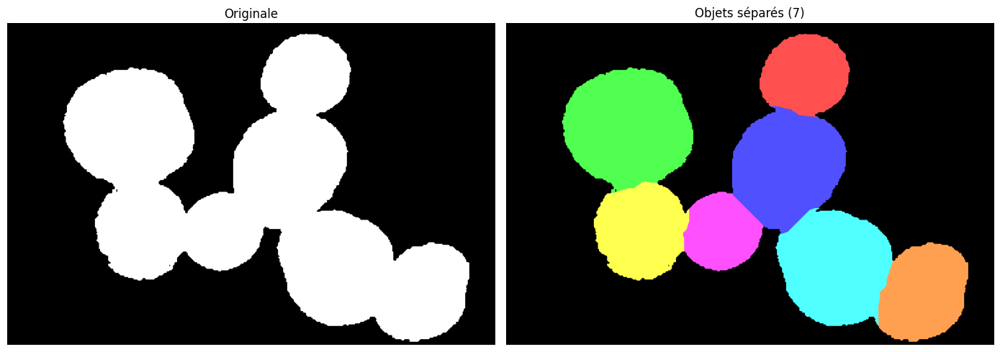

In [ ]:
from PIL import Image, ImageFilter
from collections import deque, Counter
import matplotlib.pyplot as plt

img = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\image_03.jpg").convert("L")
img = img.point(lambda p: 255 if p > 128 else 0)
w, h = img.size
img_pixels = img.load()

# 1. Distance transform 
dist = [[0.0] * w for _ in range(h)]
for y in range(h):
    for x in range(w):
        dist[y][x] = float('inf') if img_pixels[x, y] == 255 else 0

for y in range(1, h):
    for x in range(1, w - 1):
        if dist[y][x] > 0:
            dist[y][x] = min(dist[y][x],
                dist[y][x-1] + 3, dist[y-1][x] + 3,
                dist[y-1][x-1] + 4, dist[y-1][x+1] + 4)

for y in range(h - 2, -1, -1):
    for x in range(w - 2, 0, -1):
        if dist[y][x] > 0:
            dist[y][x] = min(dist[y][x],
                dist[y][x+1] + 3, dist[y+1][x] + 3,
                dist[y+1][x+1] + 4, dist[y+1][x-1] + 4)

# 2. Seuiller pour ne garder que les centres des objets
max_dist = max(max(row) for row in dist)
thresh = max_dist * 0.54

# 3. Labellisation par flood fill
labels = [[0] * w for _ in range(h)]
label_id = 0
for y in range(h):
    for x in range(w):
        if dist[y][x] >= thresh and labels[y][x] == 0:
            label_id += 1
            queue = deque([(x, y)])
            while queue:
                cx, cy = queue.popleft()
                if 0 <= cx < w and 0 <= cy < h and dist[cy][cx] >= thresh and labels[cy][cx] == 0:
                    labels[cy][cx] = label_id
                    queue.extend([(cx+1,cy),(cx-1,cy),(cx,cy+1),(cx,cy-1)])

# Filtrer les fragments
counts = Counter()
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            counts[labels[y][x]] += 1
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0 and counts[labels[y][x]] < 50:
            labels[y][x] = 0

# 4. Watershed : propager les labels sur l'image originale
queue = deque()
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            queue.append((x, y))

while queue:
    cx, cy = queue.popleft()
    for dx, dy in [(1,0),(-1,0),(0,1),(0,-1)]:
        nx, ny = cx + dx, cy + dy
        if 0 <= nx < w and 0 <= ny < h and labels[ny][nx] == 0 and img_pixels[nx, ny] == 255:
            labels[ny][nx] = labels[cy][cx]
            queue.append((nx, ny))

# 5. Coloriser
colors = [(255,80,80),(80,255,80),(80,80,255),(255,255,80),(255,80,255),(80,255,255),(255,160,80)]
result = Image.new("RGB", (w, h), (0, 0, 0))
rp = result.load()
for y in range(h):
    for x in range(w):
        if labels[y][x] > 0:
            rp[x, y] = colors[(labels[y][x] - 1) % len(colors)]

# Affichage
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
ax1.imshow(img, cmap='gray')
ax1.set_title("Originale")
ax1.axis("off")
ax2.imshow(result)
ax2.set_title(f"Objets séparés (7)")
ax2.axis("off")
plt.tight_layout()
plt.show()

# Nettoyage de Mona Lisa

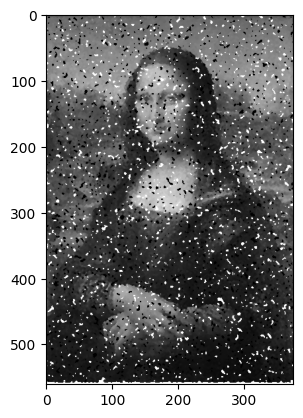

In [114]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

image = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\mona.png")

img_denoised = image.filter(ImageFilter.MedianFilter(size=3))

plt.imshow(img_denoised)
plt.imshow(img_denoised)

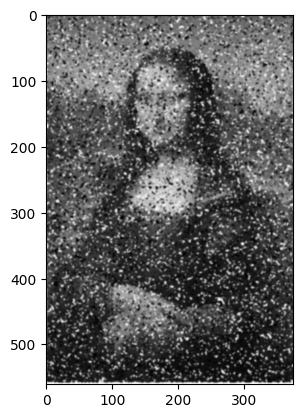

In [115]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

image = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\mona.png")

img_denoised = image.filter(ImageFilter.GaussianBlur(radius=1))

plt.imshow(img_denoised)
plt.imshow(img_denoised)

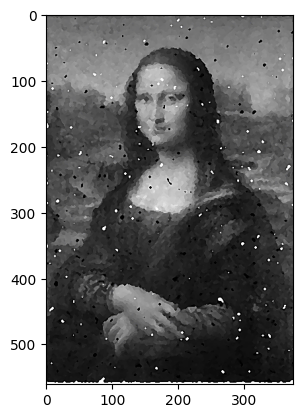

In [116]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from PIL import ImageEnhance

image = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\mona.png")
for _ in range(5):
    image = image.filter(ImageFilter.MedianFilter(size=3))
    image = image.filter(ImageFilter.GaussianBlur(radius=0.3))
    image = ImageEnhance.Sharpness(image).enhance(2)

plt.imshow(image)

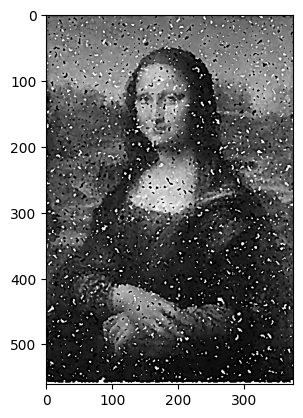

In [117]:
from PIL import Image, ImageFilter

img = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\mona.png")

# D'abord débruiter légèrement
img = img.filter(ImageFilter.MedianFilter(size=3))

# Puis UnsharpMask — bien plus contrôlable que ImageEnhance.Sharpness
img = img.filter(ImageFilter.UnsharpMask(
    radius=2,        # taille de la zone analysée
    percent=150,     # intensité de l'accentuation (100-200 typiquement)
    threshold=5      # ignore les différences < 3 niveaux → ne renforce pas le bruit
))

plt.imshow(img)

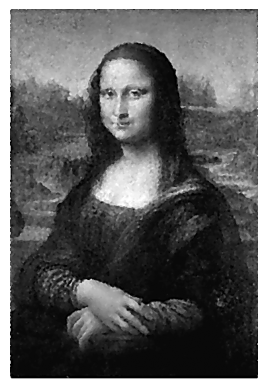

In [ ]:
from PIL import Image, ImageFilter, ImageEnhance

img = Image.open("C:\\Users\\julyc\\OneDrive\\Bureau\\Stage\\POC\\brief_OpenCV\\brief_OpenCV\\mona.png").convert("L")

thresholds = [(240, 15), (235, 20), (230, 25)]

for white_thresh, black_thresh in thresholds:
    pixels = img.load()
    w, h = img.size
    for y in range(1, h - 1):
        for x in range(1, w - 1):
            p = pixels[x, y]
            if p > white_thresh or p < black_thresh:
                neighbors = []
                for dy in [-1, 0, 1]:
                    for dx in [-1, 0, 1]:
                        if dx == 0 and dy == 0:
                            continue
                        n = pixels[x + dx, y + dy]
                        if black_thresh <= n <= white_thresh:
                            neighbors.append(n)
                if neighbors:
                    pixels[x, y] = sum(neighbors) // len(neighbors)

img = img.filter(ImageFilter.MedianFilter(3))
img = img.filter(ImageFilter.UnsharpMask(radius=2, percent=120, threshold=3))
img = ImageEnhance.Contrast(img).enhance(1.3)

# img.show()

plt.imshow(img, cmap='gray')    # pour enlever la couleur verte avec matplotlib
plt.axis('off')
plt.show()